In [241]:
from aja_pose import Model

import os
import yaml
import sys
import warnings
import os.path as osp

import torch
import torchvision.transforms as transforms
from PIL import Image
import cv2
import matplotlib.pyplot as plt


warnings.filterwarnings("ignore")
# get the current path
module_dir = os.getcwd()


 # yaml file path
yaml_file = os.path.join(module_dir, 'aja_pose', 'experiments', 'mpii', 'vhrbirdpose', 'w32_256x256_adam_lr1e-3_ak_vhr_s.yaml')
pretrained_model = os.path.join(module_dir, 'aja_pose', 'modelDir', 'all_animals_no_pretrain_106.pth')

def add_path(path):
    if path not in sys.path:
        sys.path.insert(0, path)


# this_dir = osp.dirname(__file__)

lib_path = osp.join(module_dir, 'aja_pose', 'lib')
add_path(lib_path)

import models

from aja_pose.lib.config import cfg
from aja_pose.lib.core.inference import *
from aja_pose.lib.utils.transforms import transform_preds

In [321]:
class Args:
    def __init__(self, cfg, opts=[],modelDir='', logDir='', dataDir='', prevModelDir=''):
        self.cfg = cfg
        self.opts = opts
        self.modelDir = modelDir
        self.logDir = logDir
        self.dataDir = dataDir
        self.prevModelDir = prevModelDir


# path to data directory
class RunInferences(Model): # Inherit from the Model class
    # add path to lib directory
    def add_path(self):
        lib_path = osp.join(module_dir, 'lib')
        if lib_path not in sys.path:
            sys.path.insert(0, lib_path)
    
    def load_model(self, pretrained=pretrained_model):
        sys.path.append(os.path.join(module_dir, 'lib'))
        from aja_pose.lib.config import cfg
        from aja_pose.lib.config import update_config

        
        super().write_yaml(yaml_file, pretrained=pretrained)
        
        if torch.cuda.is_available():
            device = torch.device('cuda')
        else:
            device = torch.device('cpu')
        
        args = Args(yaml_file)
        
        update_config(cfg, args)
        
        # load the model
        model = eval('models.'+cfg.MODEL.NAME+'.get_pose_net')(
            cfg, is_train=False
        )

        # load the model weights
        model.load_state_dict(torch.load(cfg.TEST.MODEL_FILE, map_location=device), strict=False)
        model.eval()

        return model
    # load image
    def load_image(self, image_path):
        image = Image.open(image_path)
        # imag
    
    # Image inference
    def image_pose(self, image_path, thresh=0.5, model=pretrained_model):
        # image transformation
        image_transform = transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])

        # load the model
        model = self.load_model(pretrained=model)

        # model = inf.load_model()

        # load the image
        image = Image.open(image_path).convert('RGB')
        # get the image size
        image_size = image.size
        print(image_size)
        # Transform the image
        image2 = image_transform(image)
        # add batch dimension
        image_unsq = image2.unsqueeze(0)
        # get the keypoints from the model
        with torch.no_grad():
            output = model(image_unsq) # shape (1,23,64,64) Heatmap
                # get the image centre
        def get_image_center():
            return 128,128

        # get the image scale with respect to 200px
        def get_image_scale():
            from math import sqrt
            width = 256
            height = 256
            return 200/sqrt(width * height)

        center = list(get_image_center())
        scale = get_image_scale()

        cent = np.array([[center]])
        sc = [scale]
        print(sc)
        coords, maxvals = get_final_preds(
                        cfg, output.clone().cpu().numpy(), cent, sc)
        # convert image to numpy
        # img = image.numpy().transpose(1,2,0)
        # resize to the original image size
        # img = cv2.resize(img, image_size)
        # thresh = 0.5
        # remove normalization
        # img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        # img = np.clip(img, 0, 1)
        plt.imshow(image)
        plt.title('Image and predicted keypoints')
        plt.axis('off')

        # Plot the keypoints
        for i in range(len(coords[0])):  # Iterate through each keypoint
            x, y = coords[0][i]
            x,y = x/256*image_size[0], y/256*image_size[1]
            if maxvals[0][i] < thresh:
                continue

            plt.scatter(x,y, color='red', s=10)  # Plot the keypoint on the image

        plt.show()

In [304]:
x, y = coords[0][0]

In [308]:
x/256*image_size[0], y/256*image_size[1]

(129.7642364501953, 37.939552307128906)

In [309]:
image_size

(228, 158)

In [322]:
inf = RunInferences()
# model = inf.load_model()

In [296]:
# image dir path
def load_random_image():
    import random
    images_path = os.path.join(module_dir, 'aja_pose', 'dataDir')
    # choose a random image
    image = random.choice(os.listdir(images_path))
    image_path = os.path.join(images_path, image)
    # if file does not endwith .mp4 skip
    if image_path.endswith('.mp4'):
        load_random_image()
    return image_path

image_path = load_random_image()  
    

(245, 206)
[0.78125]
0.78125


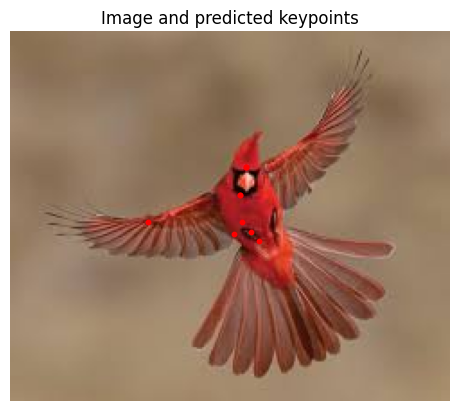

In [323]:
inf.image_pose(image_path, thresh=0.5)

(245, 206)
[0.78125]
0.78125


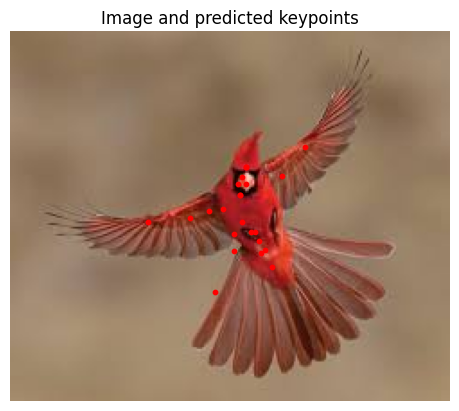

In [324]:
inf.image_pose(image_path, thresh=0.1)

0x0-horses-the-wings-of-mankind-1527015927739.jpg
(1926, 1086)
[0.78125]
0.78125


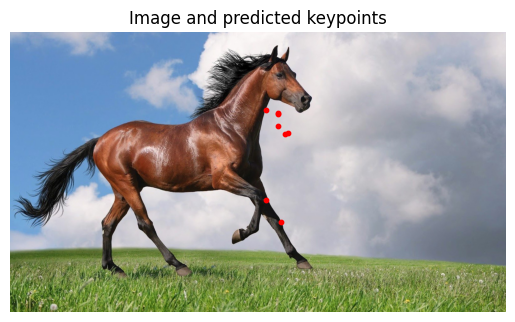

8q90217t58_Humpback_Whale_and_Calf_WW2131047.jpg
(1000, 600)
[0.78125]
0.78125


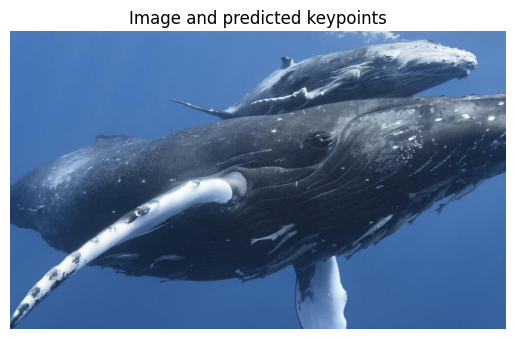

ABJYRLSQ_f000034.jpg
(640, 360)
[0.78125]
0.78125


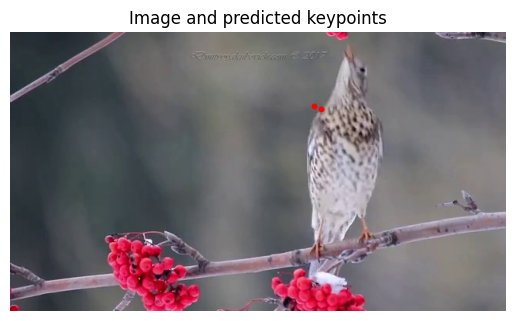

AdobeStock_96520936_541522_reduced.jpg
(768, 432)
[0.78125]
0.78125


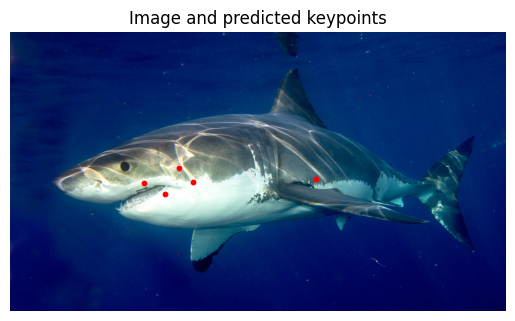

animals_hero_lizards.jpg
(1920, 1080)
[0.78125]
0.78125


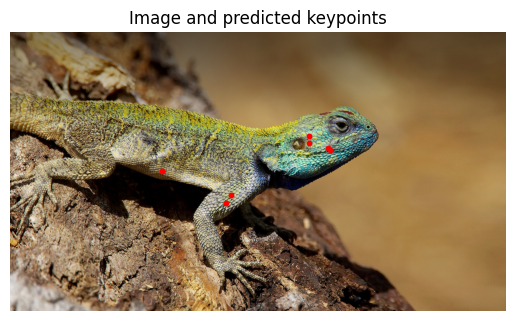

bird.jfif
(228, 158)
[0.78125]
0.78125


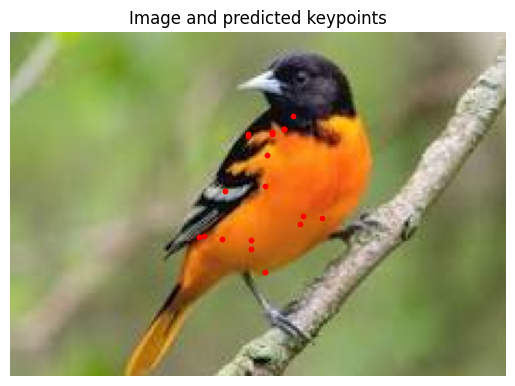

covergushter.jpg
(900, 506)
[0.78125]
0.78125


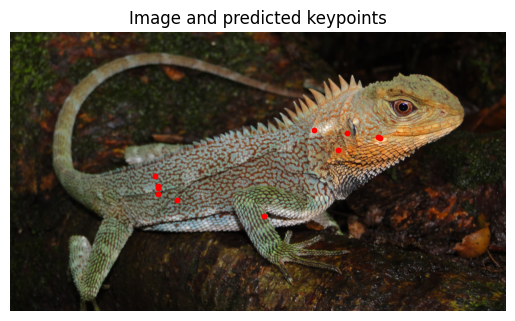

Crocodile-Pic.jpg
(1100, 619)
[0.78125]
0.78125


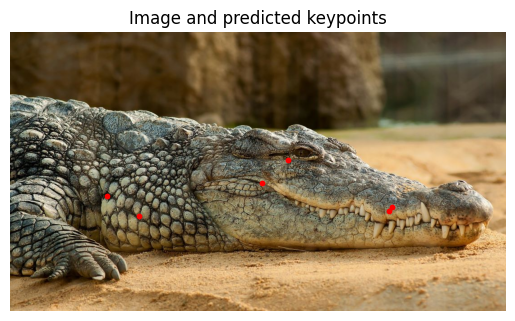

download (1).jfif
(300, 168)
[0.78125]
0.78125


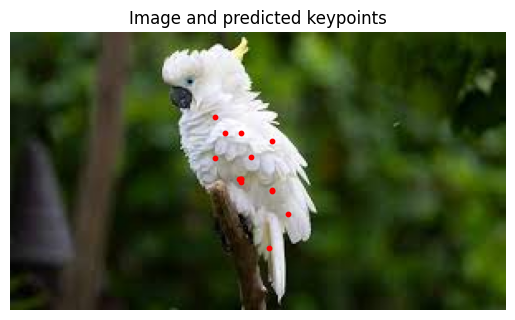

download (2).jfif
(318, 159)
[0.78125]
0.78125


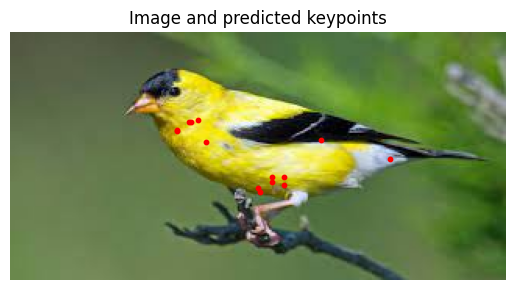

download (3).jfif
(266, 190)
[0.78125]
0.78125


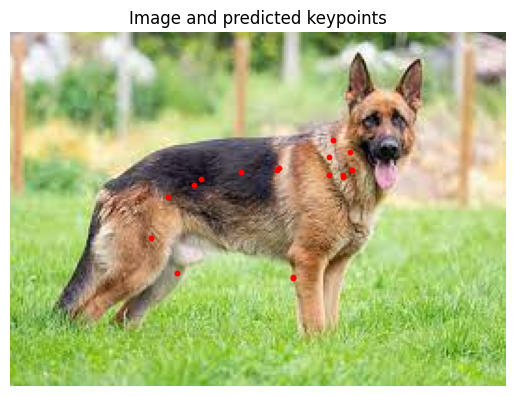

download (4).jfif
(300, 168)
[0.78125]
0.78125


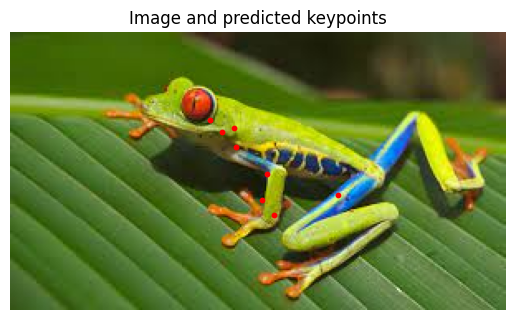

download (5).jfif
(274, 184)
[0.78125]
0.78125


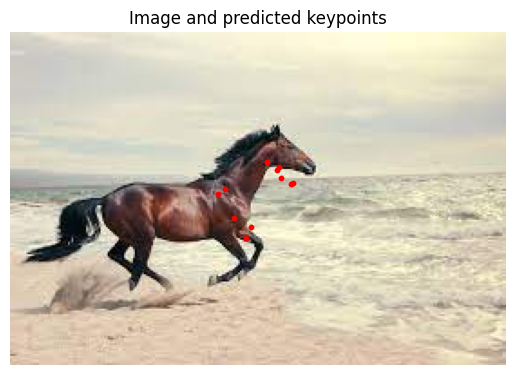

download (6).jfif
(319, 158)
[0.78125]
0.78125


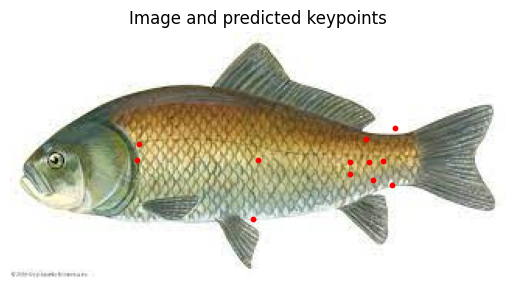

download.jfif
(275, 183)
[0.78125]
0.78125


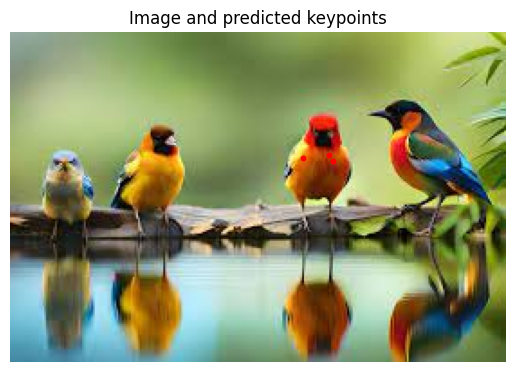

Eastern-Brown-Snake-1200x800.jpg
(1200, 800)
[0.78125]
0.78125


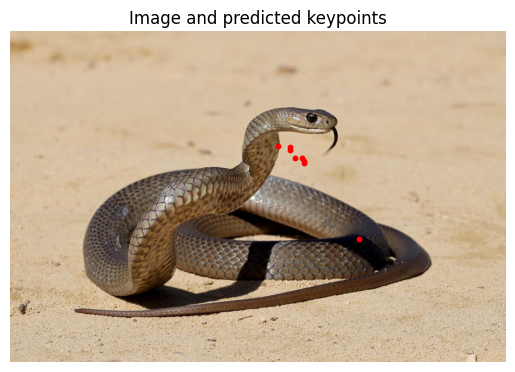

Full_Shot_of_a_Caribbean_Reef_Shark_at_Tiger_Beach_Bahamas.jpg
(3775, 2831)
[0.78125]
0.78125


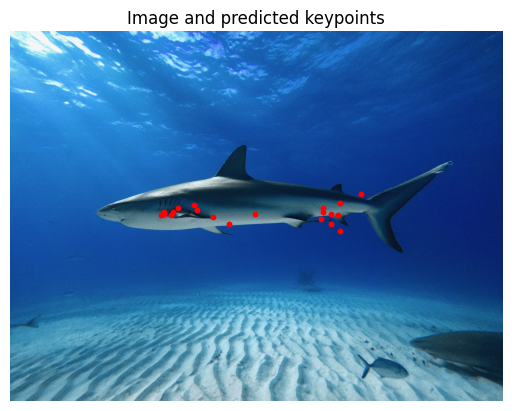

high-angle-view-of-humpback-whale-swimming-in-sea-royalty-free-image-1702574312.jpg
(1200, 1197)
[0.78125]
0.78125


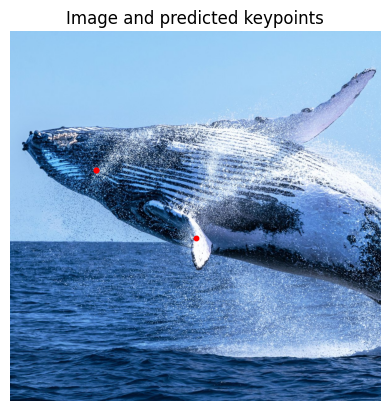

images (1).jfif
(245, 206)
[0.78125]
0.78125


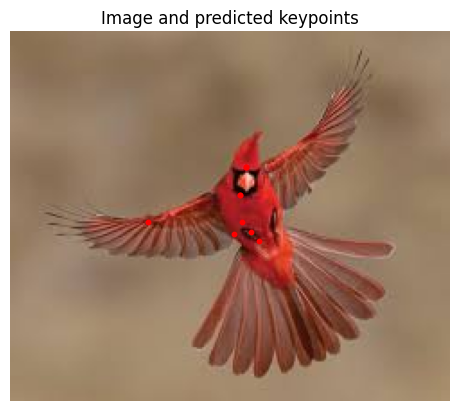

images (2).jfif
(276, 183)
[0.78125]
0.78125


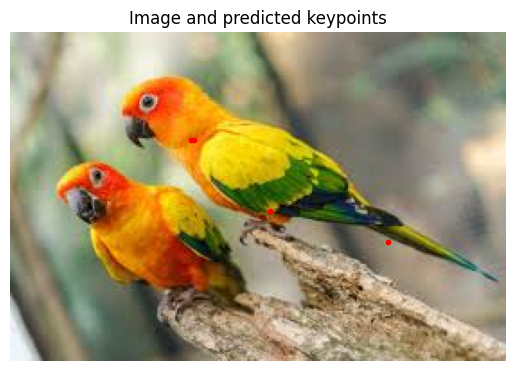

images (3).jfif
(264, 191)
[0.78125]
0.78125


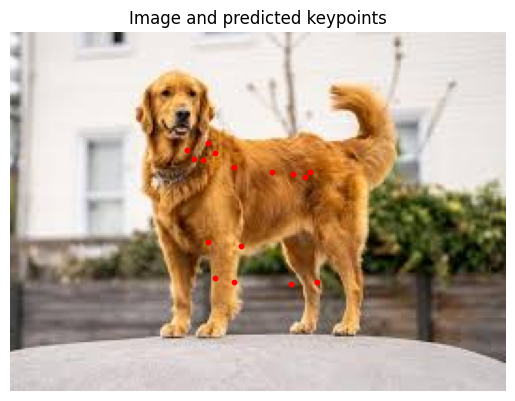

images.jfif
(225, 225)
[0.78125]
0.78125


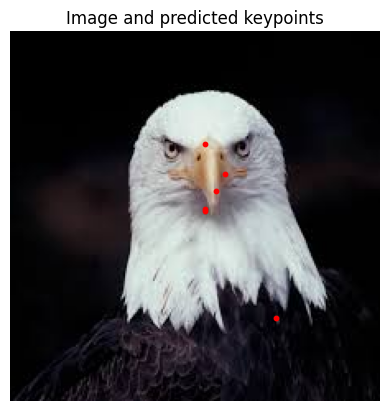

licensed-image.jfif
(2048, 2048)
[0.78125]
0.78125


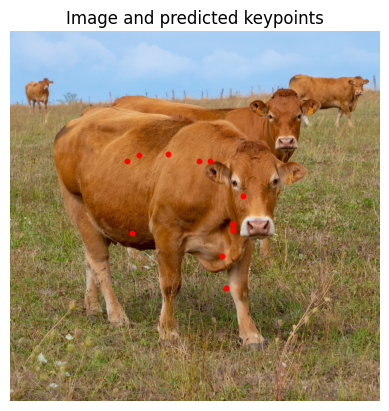

moderncrocodile_rutpratheep_nilpechr_500.jpeg
(500, 330)
[0.78125]
0.78125


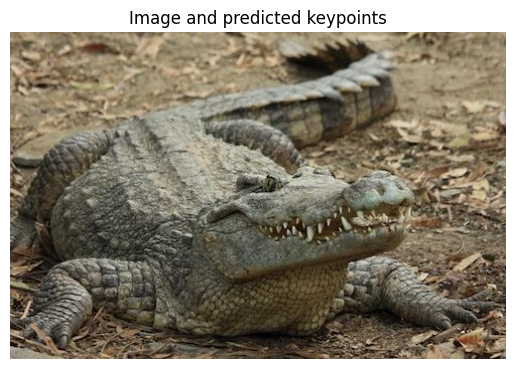

pexels-helena-lopes-1996333.jpg
(3502, 2334)
[0.78125]
0.78125


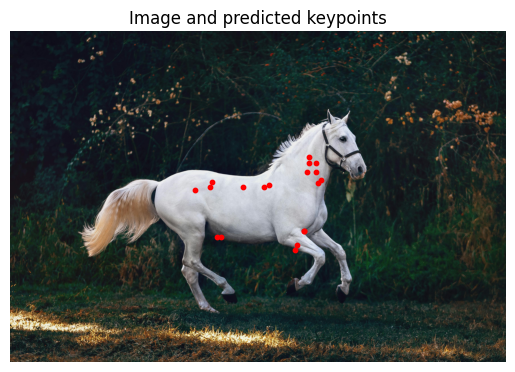

SaltwaterCrocodile('Maximo').jpg
(800, 600)
[0.78125]
0.78125


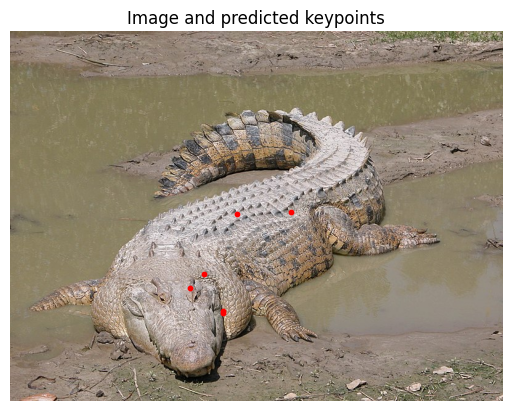

tiger-snake.jpg
(1800, 1200)
[0.78125]
0.78125


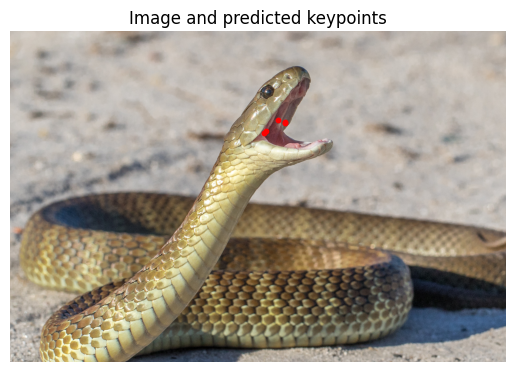

Whale-Jumping.jpg
(1400, 900)
[0.78125]
0.78125


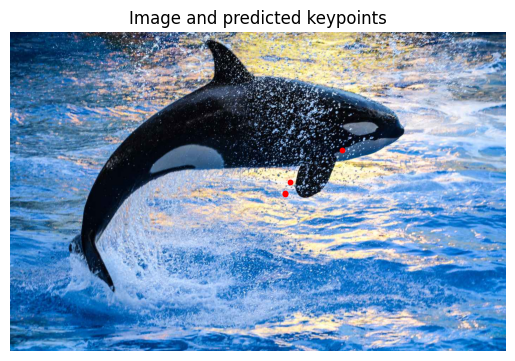

In [325]:
images_path = os.path.join(module_dir, 'aja_pose', 'dataDir')
for i in os.listdir(images_path):
    if i.endswith('.mp4'):
        continue
    print(i)
    image2_path = os.path.join(images_path, i)
    inf.image_pose(image2_path, thresh=0.5)

In [235]:
 # image transformation
image_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# load the model
model = inf.load_model()

# load the image
image = Image.open(image_path)
# get the image size
image_size = image.size
# Transform the image
image = image_transform(image)
# add batch dimension
image_unsq = image.unsqueeze(0)
# get the keypoints from the model
with torch.no_grad():
    output = model(image_unsq) # shape (1,23,64,64) Heatmap

In [236]:
# get the image centre
def get_image_center(image):
    return image.shape[2]/2, image.shape[3]/2

# get the image scale with respect to 200px
def get_image_scale(image):
    return 200/image.shape[2]

center = list(get_image_center(image_unsq))
scale = get_image_scale(image_unsq)

In [237]:
cent = np.array([[center]])
sc = [scale]
coords, maxvals = get_final_preds(
                cfg, output.clone().cpu().numpy(), cent, sc)


0.78125


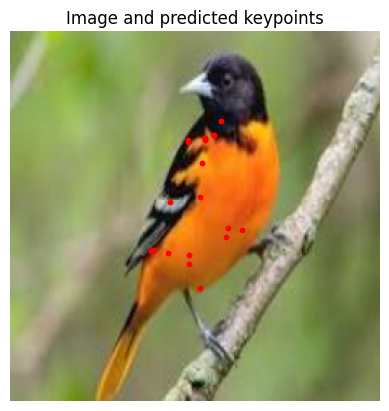

In [240]:
import matplotlib.pyplot as plt
import cv2
img = image.numpy().transpose(1,2,0)
# resize to the original image size
# img = cv2.resize(img, image_size)
thresh = 0.5
# remove normalization
img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
img = np.clip(img, 0, 1)
plt.imshow(img)
plt.title('Image and predicted keypoints')
plt.axis('off')

# Plot the keypoints
for i in range(len(coords[0])):  # Iterate through each keypoint
    x, y = coords[0][i]
    # x,y = x/256*image_size[0], y/256*image_size[1]
    if maxvals[0][i] < thresh:
        continue

    plt.scatter(x,y, color='red', s=10)  # Plot the keypoint on the image

plt.show()

In [230]:
img.shape

(1080, 1920, 3)

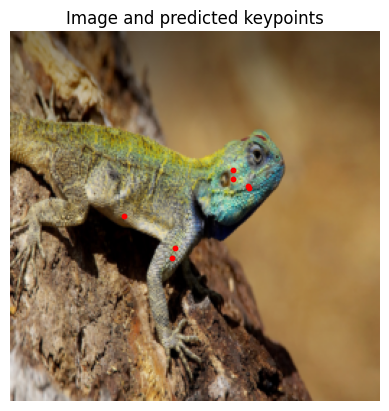

In [226]:
import matplotlib.pyplot as plt
import cv2

# Assuming img, coords, and image_size are already defined
img = image.numpy().transpose(1, 2, 0)
thresh = 0.5

cv2.resize(img, (image_size[1], image_size[0]))

# Remove normalization
img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
img = np.clip(img, 0, 1)

# Plot the image
plt.imshow(img)
plt.title('Image and predicted keypoints')
plt.axis('off')

# Plot the keypoints
for i in range(len(coords[0])):  # Iterate through each keypoint
    x, y = coords[0][i]
    if maxvals[0][i] < thresh:
        continue

    plt.scatter(x, y, color='red', s=10)  # Plot the keypoint on the image

plt.show()


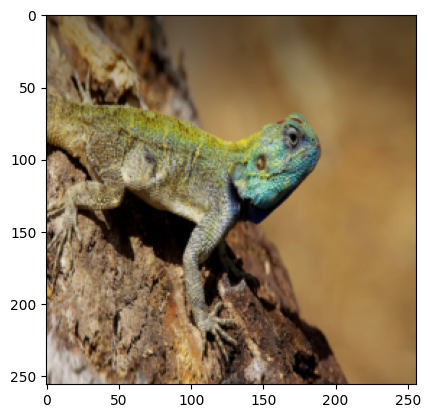

In [217]:
plt.imshow(img)

In [210]:
image_size

(1920, 1080)

In [213]:
img.shape

(256, 256, 3)

In [190]:
gh, jk = [1080, 1920]
gh/2

540.0

In [186]:
# Calculate the scale factor to resize the width to 200 pixels while maintaining the aspect ratio
scale_factor = 200 / image.shape[1]  # Desired width / Original width

# Calculate the new dimensions
new_width = 200
new_height = int(image.shape[0] * scale_factor)  # Maintain the aspect ratio

In [187]:
scale_factor

0.78125

In [157]:
len(coords[0])

23

In [150]:
img = image.numpy().transpose(1,2,0)

for i in range(len(coords[0])):
    x, y = coords[0][i]
    img = cv2.circle(
        img, (x,y), 0.5, (0, 255, 0)
    )

# # resize to the original image size
# img = cv2.resize(img, image_size)

# # remove normalization
# img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
# # img = np.clip(img, 0, 1)

# plt.imshow(img)

error: OpenCV(4.9.0) :-1: error: (-5:Bad argument) in function 'circle'
> Overload resolution failed:
>  - Layout of the output array img is incompatible with cv::Mat
>  - Expected Ptr<cv::UMat> for argument 'img'


In [152]:
# Convert img to uint8 if necessary
img = (img * 255).astype(np.uint8)

for i in range(len(coords[0])):
    x, y = coords[0][i]
    # Ensure x and y are integers
    x, y = int(x), int(y)
    # Draw the circle on the image
    img = cv2.circle(img, (x, y), 1, (0, 255, 0), thickness=1)

# Display the image
plt.imshow(img)


error: OpenCV(4.9.0) :-1: error: (-5:Bad argument) in function 'circle'
> Overload resolution failed:
>  - Layout of the output array img is incompatible with cv::Mat
>  - Expected Ptr<cv::UMat> for argument 'img'


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


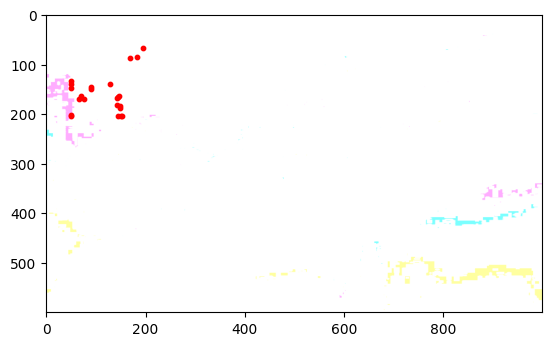

In [154]:
# draw dots at the coords to the image
import matplotlib.pyplot as plt

# Convert img to uint8 if necessary
img = (img * 255).astype(np.uint8)

# # resize to the original image size
img = cv2.resize(img, image_size)

# remove normalization
img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
# img = np.clip(img, 0, 1)

# plt.imshow(img)
# Plot the image
plt.imshow(img)

# Draw points on the image
for i in range(len(coords[0])):
    x, y = coords[0][i]
    plt.scatter(x, y, color='red', s=10)  # Draw a red point at (x, y)

# Show the plot
plt.show()





In [116]:
plot_keypoints(image, coords, maxvals, threshold=0.5)

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices